In [1]:
import torch
print(torch.cuda.is_available())
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import seaborn as sns
import scanpy as sc
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize']=(4,4)
from scanpy import AnnData
import squidpy as sq

True
Using device: cuda


## Load and View Data

In [2]:
#LOAD DATA
import json
adata=sc.read_h5ad('visium_mouse.h5ad')
with open("DATA/spatial/scalefactors_json.json", "r") as f:
    scalefactors = json.load(f)
adata.uns["spatial"] = {"library_id": {"scalefactors": scalefactors}}
# Load the high-resolution tissue image
scale = adata.uns['spatial']['library_id']['scalefactors']['tissue_lowres_scalef']
img = sq.im.ImageContainer("DATA/spatial/tissue_lowres_image.png", scale=scale)
sq.im.process(img)

# Extract image array
image_array = img.data['image'].values  # Shape: (600, 508, 1, 3)
print("Image array shape:", image_array.shape)

# Squeeze the singleton dimension and permute
image_array = image_array.squeeze(2)  # Shape: (600, 508, 3)
img_tensor = torch.from_numpy(image_array).permute(2, 0, 1).float() / 255.0  # Shape: (3, 600, 508)

print("Image tensor shape:", img_tensor.shape)
scale = adata.uns['spatial']['library_id']['scalefactors']['tissue_lowres_scalef']
s = scale  # tissue_lowres_scalef
adata.obsm['X_spatial']=np.round(adata.obsm['X_spatial'] * s).astype(int)

Image array shape: (600, 508, 1, 3)
Image tensor shape: torch.Size([3, 600, 508])


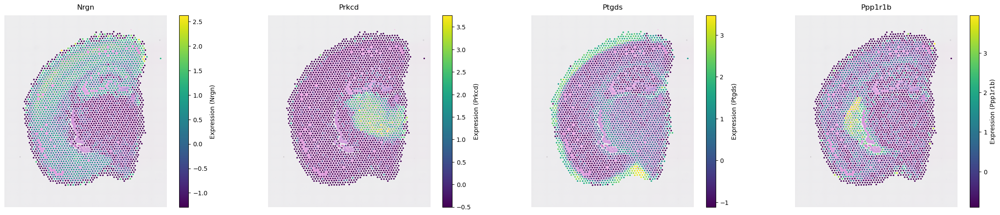

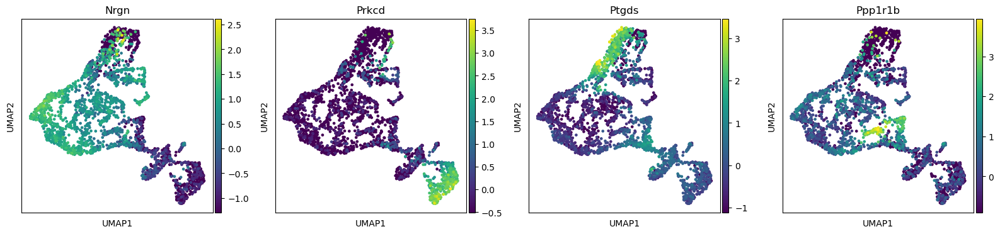

In [3]:
#actual spatial representation
from plotting import visualize_gene_expression_4genes

gene_names = ['Nrgn', 'Prkcd', 'Ptgds','Ppp1r1b',]
gene_indices = [adata.var.index.get_loc(name) for name in gene_names]
visualize_gene_expression_4genes(img_tensor.cpu(), adata.obsm['X_spatial'], adata, gene_indices, gene_names)

In [4]:
#import from custom files
from model import compute_loss,AutoencoderWithGeneExpression

True
Using device: cuda


## Prepare Data

In [5]:
#MOD DATA
genes=['Nrgn', 'Prkcd', 'Ptgds','Ppp1r1b',]
adata=adata[:,genes]
spatial_coords=adata.obsm['X_spatial'].copy()
spatial_coords[:,1]=spatial_coords[:,1]*-1
gene_expression = adata.X.toarray() if hasattr(adata.X, 'toarray') else adata.X
num_genes = gene_expression.shape[1]
print(f"Number of spots: {len(spatial_coords)}, Number of genes: {num_genes}")

# Step 4: Create spot_data as a list of tuples [(x, y, gene_expr), ...]
spot_data = []
for i in range(len(spatial_coords)):
    x, y = spatial_coords[i]  # Extract x, y coordinates
    g = gene_expression[i].tolist()  # Gene expression vector as a list
    spot_data.append((x, y, g))

Number of spots: 2678, Number of genes: 4


In [6]:
num_genes = len(spot_data[0][2])  # Number of genes

# Instantiate the model
model = AutoencoderWithGeneExpression(num_genes=num_genes).to(device)
img_tensor=img_tensor.to(device)
optimizer = optim.Adam(model.parameters(), lr=0.001)

#pixels covered by spatial pseudocell
spot_size = 10  


## Image reconstruction pretraining loop

Epoch [100/1000], Total Loss: 0.0582, Img Loss: 0.0582, GE Loss: 0.0000
Epoch [200/1000], Total Loss: 0.0438, Img Loss: 0.0438, GE Loss: 0.0000
Epoch [300/1000], Total Loss: 0.0408, Img Loss: 0.0408, GE Loss: 0.0000
Epoch [400/1000], Total Loss: 0.0371, Img Loss: 0.0371, GE Loss: 0.0000
Epoch [500/1000], Total Loss: 0.0360, Img Loss: 0.0360, GE Loss: 0.0000
early stopping


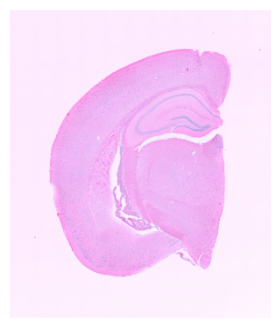

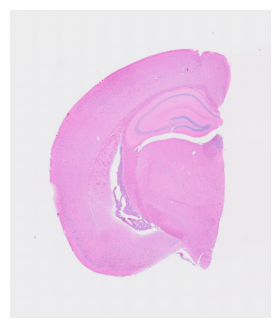

In [7]:
num_epochs = 1000
min_loss=np.Inf
last_loss_update=0
for epoch in range(num_epochs):
    # Forward pass
    embedding, reconstructed_image, gene_expression_map = model(img_tensor)
    # Compute loss
    total_loss, loss_img, loss_ge = compute_loss(
        reconstructed_image, gene_expression_map, img_tensor, spot_data, spot_size, lambda_ge=.01,no_gene_loss=True
    )
    # Backward pass
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    if (epoch + 1) % 100 == 0:
        print(f"Epoch [{epoch+1}/{num_epochs}], Total Loss: {total_loss.item():.4f}, "
              f"Img Loss: {loss_img.item():.4f}, GE Loss: {loss_ge.item():.4f}")
    if total_loss<min_loss:
        min_loss=total_loss
        last_loss_update=0
    else:
        last_loss_update+=1
    if last_loss_update>30:
        print('early stopping')
        break
image = reconstructed_image.squeeze(0).permute(1, 2, 0).cpu().detach().numpy()  # Shape: (600, 508, 3)
plt.imshow(image)
plt.axis("off")
plt.show()
image = img_tensor.squeeze(0).permute(1, 2, 0).cpu().numpy()  # Shape: (600, 508, 3)
plt.imshow(image)
plt.axis("off")
plt.show()

In [8]:
# #Freeze image recon weights, increase learning rate for GEX
# for name, param in model.named_parameters():
#     if "decoder2" not in name:
#         param.requires_grad = False

# # Reinitialize optimizer with only decoder2 parameters
# optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=0.01)

## Gene Expression and image loss training loop

Epoch [2/5000], Total Loss: 1.3295, Img Loss: 0.0503, GE Loss: 1.2791


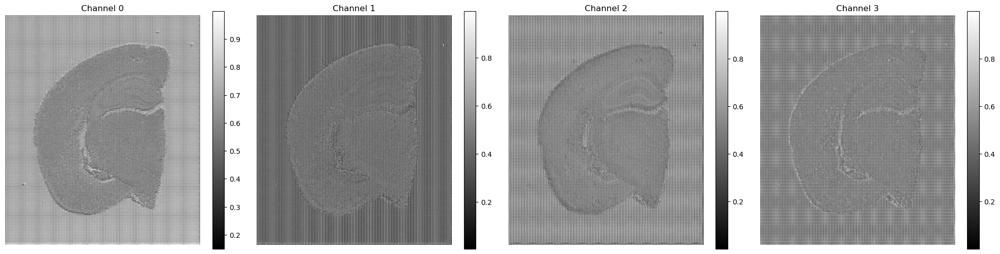

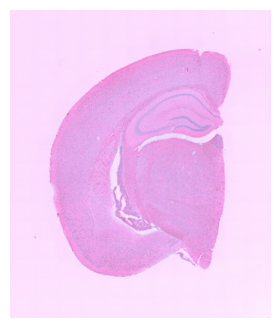

Epoch [10/5000], Total Loss: 1.0978, Img Loss: 0.1020, GE Loss: 0.9959
Epoch [11/5000], Total Loss: 1.0844, Img Loss: 0.0898, GE Loss: 0.9946


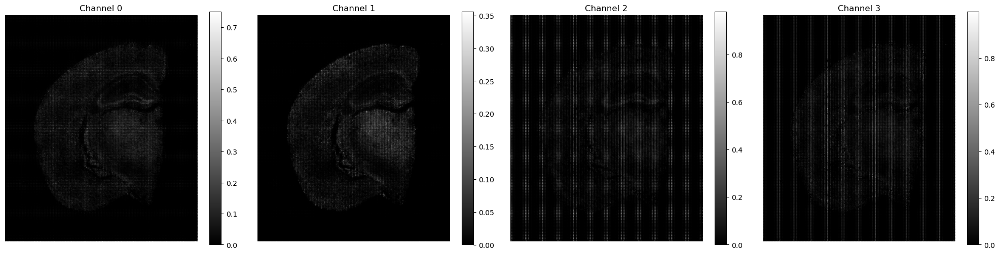

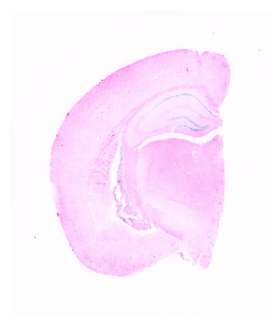

Epoch [20/5000], Total Loss: 1.0506, Img Loss: 0.0601, GE Loss: 0.9906
Epoch [30/5000], Total Loss: 1.0368, Img Loss: 0.0508, GE Loss: 0.9860
Epoch [40/5000], Total Loss: 1.0244, Img Loss: 0.0497, GE Loss: 0.9748
Epoch [50/5000], Total Loss: 0.9494, Img Loss: 0.0773, GE Loss: 0.8721
Epoch [51/5000], Total Loss: 0.9367, Img Loss: 0.0830, GE Loss: 0.8537


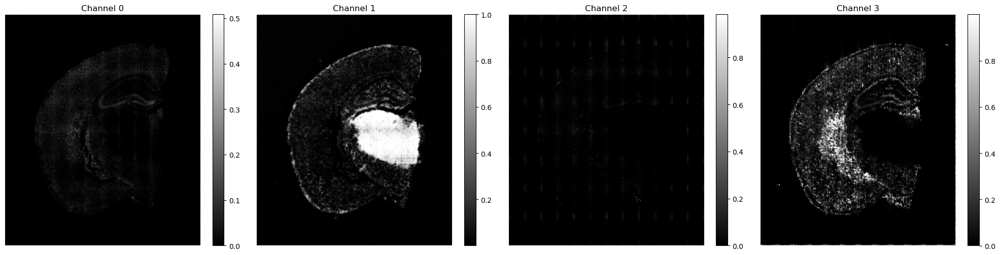

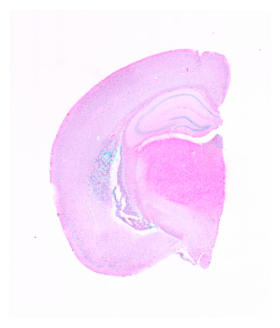

Epoch [60/5000], Total Loss: 0.8724, Img Loss: 0.0831, GE Loss: 0.7892
Epoch [70/5000], Total Loss: 0.8361, Img Loss: 0.0751, GE Loss: 0.7610
Epoch [80/5000], Total Loss: 0.7796, Img Loss: 0.0781, GE Loss: 0.7016
Epoch [90/5000], Total Loss: 0.6932, Img Loss: 0.0893, GE Loss: 0.6039
Epoch [100/5000], Total Loss: 0.6638, Img Loss: 0.0844, GE Loss: 0.5795
Epoch [100/5000], Total Loss: 0.6638, Img Loss: 0.0844, GE Loss: 0.5795


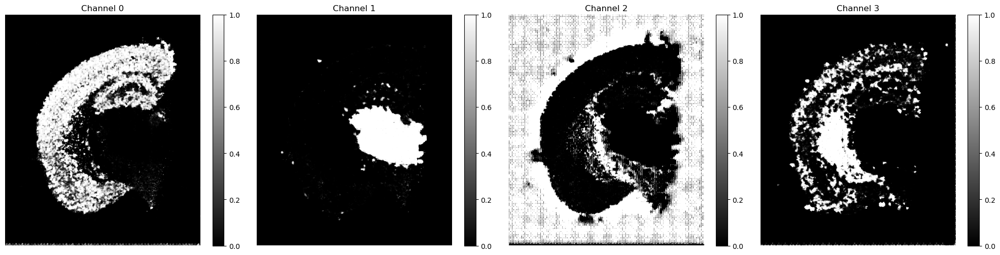

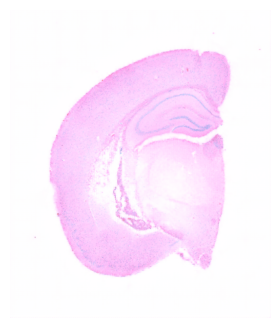

Epoch [110/5000], Total Loss: 0.6493, Img Loss: 0.0768, GE Loss: 0.5725
Epoch [120/5000], Total Loss: 0.6406, Img Loss: 0.0716, GE Loss: 0.5690
Epoch [130/5000], Total Loss: 0.6352, Img Loss: 0.0683, GE Loss: 0.5669
Epoch [140/5000], Total Loss: 0.6311, Img Loss: 0.0656, GE Loss: 0.5655
Epoch [150/5000], Total Loss: 0.6270, Img Loss: 0.0624, GE Loss: 0.5647
Epoch [160/5000], Total Loss: 0.6251, Img Loss: 0.0613, GE Loss: 0.5638
Epoch [170/5000], Total Loss: 0.6229, Img Loss: 0.0595, GE Loss: 0.5633
Epoch [180/5000], Total Loss: 0.6204, Img Loss: 0.0579, GE Loss: 0.5626
Epoch [190/5000], Total Loss: 0.6200, Img Loss: 0.0578, GE Loss: 0.5622
Epoch [200/5000], Total Loss: 0.6182, Img Loss: 0.0565, GE Loss: 0.5617
Epoch [200/5000], Total Loss: 0.6182, Img Loss: 0.0565, GE Loss: 0.5617


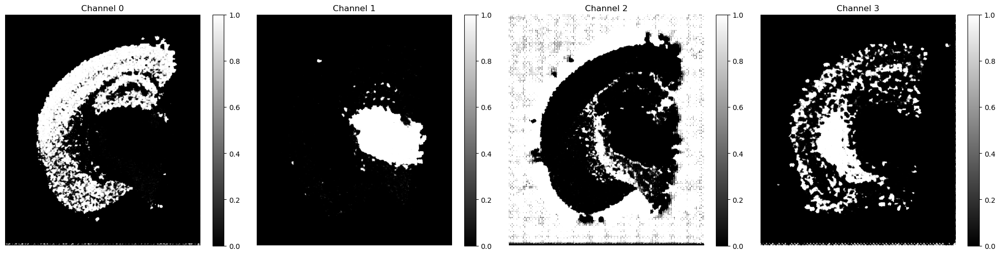

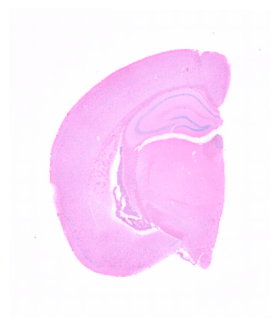

Epoch [210/5000], Total Loss: 0.6170, Img Loss: 0.0557, GE Loss: 0.5613
Epoch [220/5000], Total Loss: 0.6159, Img Loss: 0.0549, GE Loss: 0.5610
Epoch [230/5000], Total Loss: 0.6148, Img Loss: 0.0541, GE Loss: 0.5607
Epoch [240/5000], Total Loss: 0.6149, Img Loss: 0.0544, GE Loss: 0.5605
Epoch [250/5000], Total Loss: 0.6141, Img Loss: 0.0537, GE Loss: 0.5604
Epoch [260/5000], Total Loss: 0.6136, Img Loss: 0.0535, GE Loss: 0.5601
Epoch [270/5000], Total Loss: 0.6118, Img Loss: 0.0519, GE Loss: 0.5600
Epoch [280/5000], Total Loss: 0.6115, Img Loss: 0.0516, GE Loss: 0.5599
Epoch [290/5000], Total Loss: 0.6101, Img Loss: 0.0505, GE Loss: 0.5596
Epoch [300/5000], Total Loss: 0.6122, Img Loss: 0.0526, GE Loss: 0.5596
Epoch [300/5000], Total Loss: 0.6122, Img Loss: 0.0526, GE Loss: 0.5596


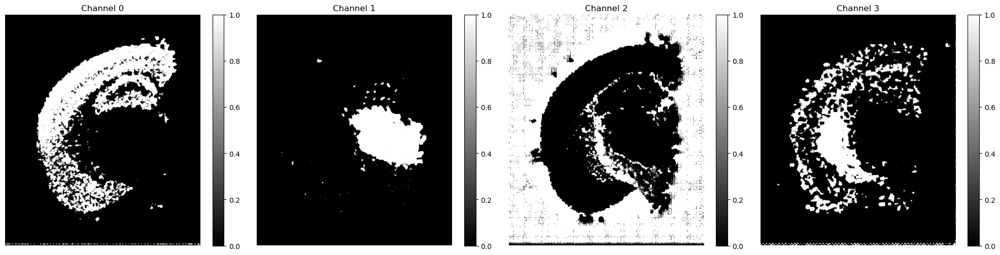

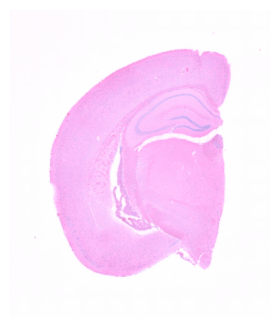

Epoch [310/5000], Total Loss: 0.6094, Img Loss: 0.0499, GE Loss: 0.5594
Epoch [320/5000], Total Loss: 0.6096, Img Loss: 0.0504, GE Loss: 0.5591
Epoch [330/5000], Total Loss: 0.6085, Img Loss: 0.0494, GE Loss: 0.5591
Epoch [340/5000], Total Loss: 0.6080, Img Loss: 0.0490, GE Loss: 0.5589
Epoch [350/5000], Total Loss: 0.6072, Img Loss: 0.0484, GE Loss: 0.5588
Epoch [360/5000], Total Loss: 0.6074, Img Loss: 0.0485, GE Loss: 0.5588
Epoch [370/5000], Total Loss: 0.6058, Img Loss: 0.0472, GE Loss: 0.5586
Epoch [380/5000], Total Loss: 0.6059, Img Loss: 0.0473, GE Loss: 0.5586
Epoch [390/5000], Total Loss: 0.6058, Img Loss: 0.0473, GE Loss: 0.5584
Epoch [400/5000], Total Loss: 0.6046, Img Loss: 0.0463, GE Loss: 0.5583
Epoch [400/5000], Total Loss: 0.6046, Img Loss: 0.0463, GE Loss: 0.5583


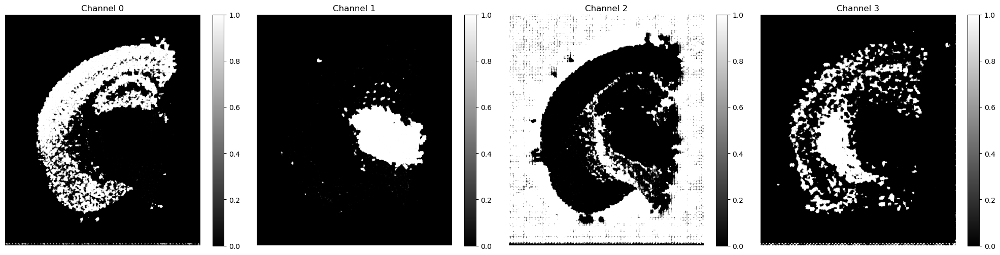

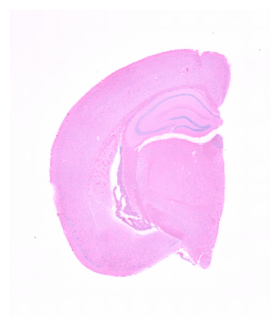

Epoch [410/5000], Total Loss: 0.6054, Img Loss: 0.0470, GE Loss: 0.5583
Epoch [420/5000], Total Loss: 0.6044, Img Loss: 0.0462, GE Loss: 0.5582
Epoch [430/5000], Total Loss: 0.6050, Img Loss: 0.0469, GE Loss: 0.5581
Epoch [440/5000], Total Loss: 0.6034, Img Loss: 0.0454, GE Loss: 0.5580
Epoch [450/5000], Total Loss: 0.6049, Img Loss: 0.0469, GE Loss: 0.5580
Epoch [460/5000], Total Loss: 0.6035, Img Loss: 0.0455, GE Loss: 0.5580
Epoch [470/5000], Total Loss: 0.6022, Img Loss: 0.0444, GE Loss: 0.5578
Epoch [480/5000], Total Loss: 0.6045, Img Loss: 0.0466, GE Loss: 0.5579
Epoch [490/5000], Total Loss: 0.6025, Img Loss: 0.0448, GE Loss: 0.5577
Epoch [500/5000], Total Loss: 0.6031, Img Loss: 0.0454, GE Loss: 0.5576
Epoch [500/5000], Total Loss: 0.6031, Img Loss: 0.0454, GE Loss: 0.5576


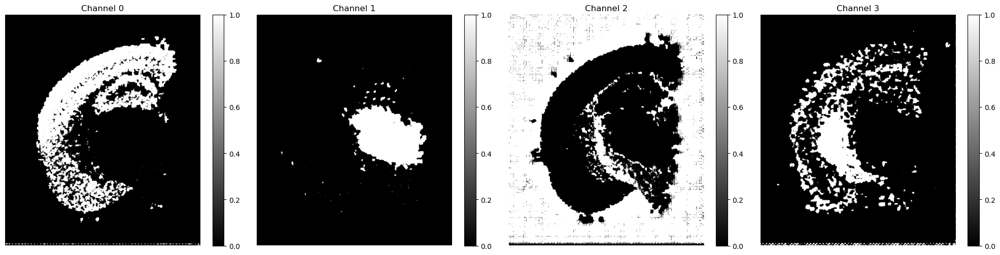

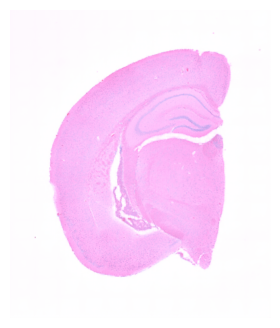

Epoch [510/5000], Total Loss: 0.6029, Img Loss: 0.0450, GE Loss: 0.5579
Epoch [520/5000], Total Loss: 0.6017, Img Loss: 0.0441, GE Loss: 0.5576
Epoch [530/5000], Total Loss: 0.6021, Img Loss: 0.0445, GE Loss: 0.5576
Epoch [540/5000], Total Loss: 0.6019, Img Loss: 0.0443, GE Loss: 0.5576
Epoch [550/5000], Total Loss: 0.6007, Img Loss: 0.0433, GE Loss: 0.5574
Epoch [560/5000], Total Loss: 0.6015, Img Loss: 0.0440, GE Loss: 0.5575
Epoch [570/5000], Total Loss: 0.6014, Img Loss: 0.0439, GE Loss: 0.5575
Epoch [580/5000], Total Loss: 0.6005, Img Loss: 0.0432, GE Loss: 0.5573
Epoch [590/5000], Total Loss: 0.6007, Img Loss: 0.0434, GE Loss: 0.5573
Epoch [600/5000], Total Loss: 0.6009, Img Loss: 0.0435, GE Loss: 0.5575
Epoch [600/5000], Total Loss: 0.6009, Img Loss: 0.0435, GE Loss: 0.5575


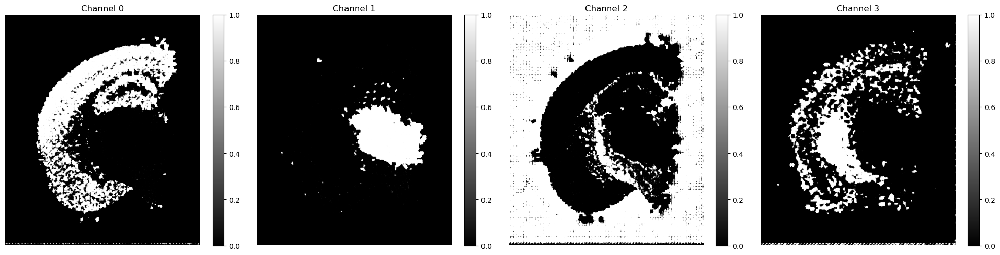

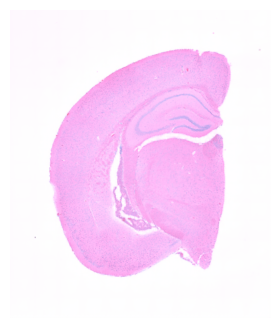

Epoch [610/5000], Total Loss: 0.6003, Img Loss: 0.0431, GE Loss: 0.5572
Epoch [620/5000], Total Loss: 0.6000, Img Loss: 0.0427, GE Loss: 0.5572
Epoch [630/5000], Total Loss: 0.6000, Img Loss: 0.0428, GE Loss: 0.5572
Epoch [640/5000], Total Loss: 0.5998, Img Loss: 0.0427, GE Loss: 0.5571
Epoch [650/5000], Total Loss: 0.5998, Img Loss: 0.0425, GE Loss: 0.5573
Epoch [660/5000], Total Loss: 0.5994, Img Loss: 0.0423, GE Loss: 0.5571
Epoch [670/5000], Total Loss: 0.5994, Img Loss: 0.0423, GE Loss: 0.5571
Epoch [680/5000], Total Loss: 0.5991, Img Loss: 0.0421, GE Loss: 0.5570
Epoch [690/5000], Total Loss: 0.5992, Img Loss: 0.0422, GE Loss: 0.5570
Epoch [700/5000], Total Loss: 0.5988, Img Loss: 0.0418, GE Loss: 0.5570
Epoch [700/5000], Total Loss: 0.5988, Img Loss: 0.0418, GE Loss: 0.5570


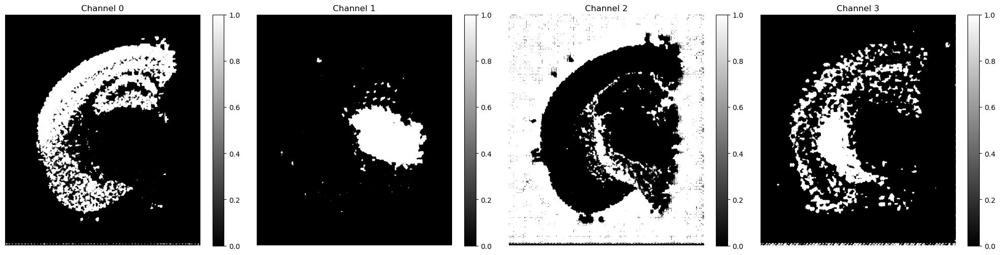

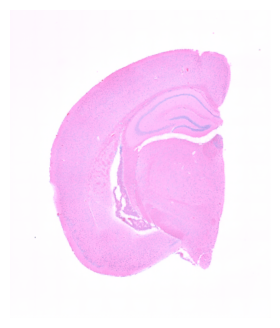

Epoch [710/5000], Total Loss: 0.5996, Img Loss: 0.0426, GE Loss: 0.5570
Epoch [720/5000], Total Loss: 0.5983, Img Loss: 0.0414, GE Loss: 0.5568
Epoch [730/5000], Total Loss: 0.5992, Img Loss: 0.0423, GE Loss: 0.5569
Epoch [740/5000], Total Loss: 0.5987, Img Loss: 0.0417, GE Loss: 0.5570
Epoch [750/5000], Total Loss: 0.5978, Img Loss: 0.0410, GE Loss: 0.5567
Epoch [760/5000], Total Loss: 0.5993, Img Loss: 0.0424, GE Loss: 0.5570
Epoch [770/5000], Total Loss: 0.5977, Img Loss: 0.0410, GE Loss: 0.5567
Epoch [780/5000], Total Loss: 0.5997, Img Loss: 0.0428, GE Loss: 0.5569
Epoch [790/5000], Total Loss: 0.5979, Img Loss: 0.0412, GE Loss: 0.5567
Epoch [800/5000], Total Loss: 0.5973, Img Loss: 0.0407, GE Loss: 0.5566
Epoch [800/5000], Total Loss: 0.5973, Img Loss: 0.0407, GE Loss: 0.5566


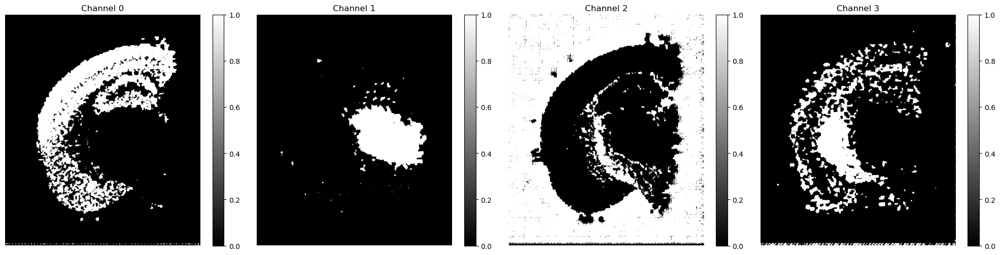

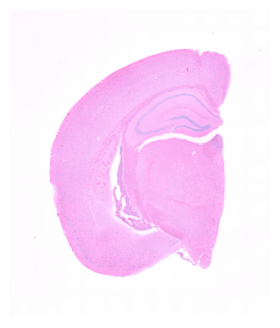

Epoch [810/5000], Total Loss: 0.5987, Img Loss: 0.0421, GE Loss: 0.5566
Epoch [820/5000], Total Loss: 0.5974, Img Loss: 0.0408, GE Loss: 0.5566
Epoch [830/5000], Total Loss: 0.5978, Img Loss: 0.0414, GE Loss: 0.5565
Epoch [840/5000], Total Loss: 0.5969, Img Loss: 0.0405, GE Loss: 0.5565
Epoch [850/5000], Total Loss: 0.5976, Img Loss: 0.0411, GE Loss: 0.5566
Epoch [860/5000], Total Loss: 0.5976, Img Loss: 0.0411, GE Loss: 0.5565
Epoch [870/5000], Total Loss: 0.5977, Img Loss: 0.0414, GE Loss: 0.5564
Epoch [880/5000], Total Loss: 0.5966, Img Loss: 0.0402, GE Loss: 0.5564
Epoch [890/5000], Total Loss: 0.5966, Img Loss: 0.0403, GE Loss: 0.5563
Epoch [900/5000], Total Loss: 0.5972, Img Loss: 0.0408, GE Loss: 0.5564
Epoch [900/5000], Total Loss: 0.5972, Img Loss: 0.0408, GE Loss: 0.5564


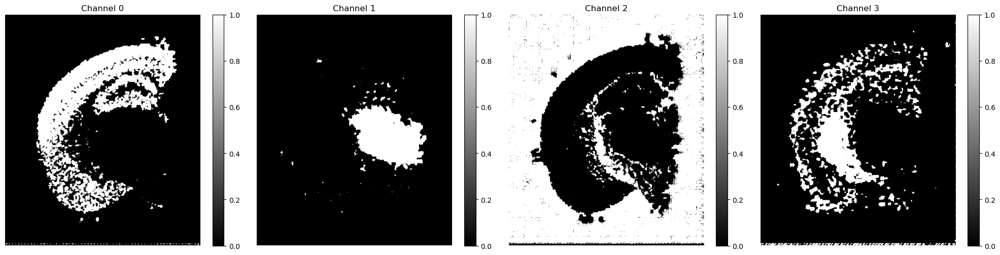

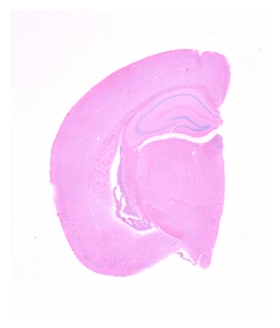

Epoch [910/5000], Total Loss: 0.5962, Img Loss: 0.0399, GE Loss: 0.5563
Epoch [920/5000], Total Loss: 0.5969, Img Loss: 0.0407, GE Loss: 0.5563
Epoch [930/5000], Total Loss: 0.5971, Img Loss: 0.0406, GE Loss: 0.5564
Epoch [940/5000], Total Loss: 0.5960, Img Loss: 0.0398, GE Loss: 0.5562
early stopping


In [9]:
num_epochs = 5000
min_loss=np.Inf
last_loss_update=0
for epoch in range(num_epochs):
    # Forward pass
    embedding, reconstructed_image, gene_expression_map = model(img_tensor)
    
    # Compute loss
    total_loss, loss_img, loss_ge = compute_loss(
        reconstructed_image, gene_expression_map, img_tensor, spot_data, spot_size, lambda_ge=1
    )
    
    # Backward pass
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    if (epoch + 1) % 10 == 0:
        print(f"Epoch [{epoch+1}/{num_epochs}], Total Loss: {total_loss.item():.4f}, "
              f"Img Loss: {loss_img.item():.4f}, GE Loss: {loss_ge.item():.4f}")
        
    if total_loss<min_loss:
        min_loss=total_loss
        last_loss_update=0
    else:
        last_loss_update+=1
    if last_loss_update>30:
        print('early stopping')
        break
    if (epoch + 1) % 100 == 0 or  epoch==1 or  epoch==10 or  epoch ==50:
        print(f"Epoch [{epoch+1}/{num_epochs}], Total Loss: {total_loss.item():.4f}, "
              f"Img Loss: {loss_img.item():.4f}, GE Loss: {loss_ge.item():.4f}")

        # Create a figure with 1 row and 4 columns
        fig, axs = plt.subplots(1, 4, figsize=(20, 5))  # Adjusted width for 4 plots

        # Plot channels 0, 1, 2, and 3
        for i, channel_index in enumerate([0,1, 2, 3]):
            single_channel = gene_expression_map[0, channel_index, :, :].cpu().detach().numpy()  # Shape: (600, 508)
            im = axs[i].imshow(single_channel, cmap="gray")
            fig.colorbar(im, ax=axs[i])  # Add colorbar for each channel
            axs[i].axis("off")
            axs[i].set_title(f"Channel {channel_index}")

        # Adjust layout to prevent overlap
        plt.tight_layout()
        plt.show()
        image = reconstructed_image.squeeze(0).permute(1, 2, 0).cpu().detach().numpy()  # Shape: (600, 508, 3)
        plt.imshow(image)
        plt.axis("off")
        plt.show()

## View Results

Reconstructed Image


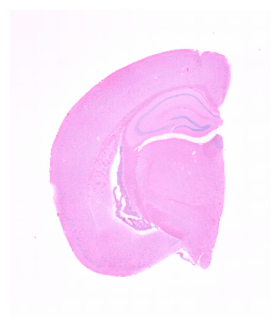

Predicted and reconstructed gene expression profiles on image space


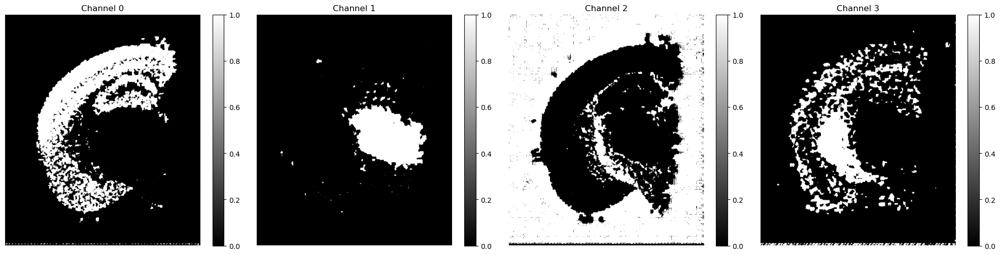

True spatial gene expression


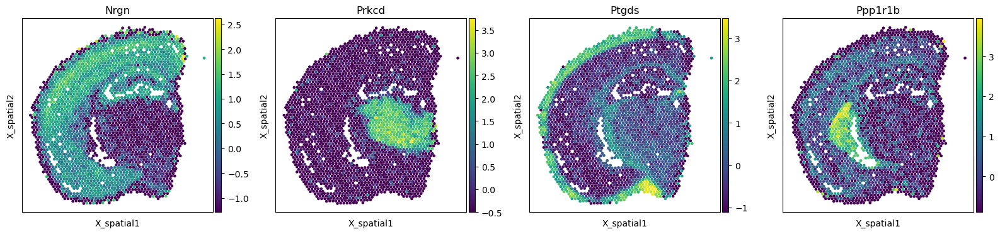

Gene Expression on UMAP


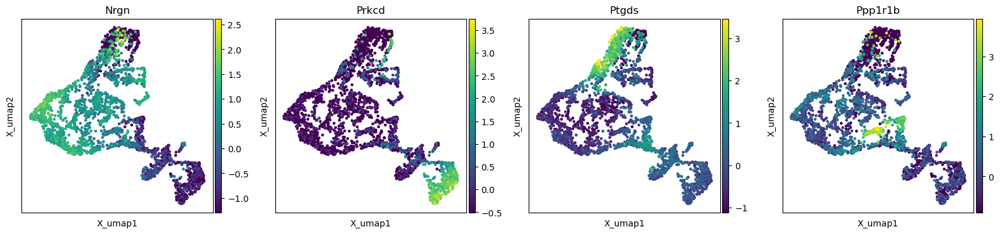

In [10]:
print('Reconstructed Image')
image = reconstructed_image.squeeze(0).permute(1, 2, 0).cpu().detach().numpy()  # Shape: (600, 508, 3)
plt.imshow(image)
plt.axis("off")
plt.show()
fig, axs = plt.subplots(1, 4, figsize=(20, 5))  # Adjusted width for 4 plots

print('Predicted and reconstructed gene expression profiles on image space')
for i, channel_index in enumerate([0,1, 2, 3]):
    single_channel = gene_expression_map[0, channel_index, :, :].cpu().detach().numpy()  # Shape: (600, 508)
    im = axs[i].imshow(single_channel, cmap="gray")
    fig.colorbar(im, ax=axs[i])  # Add colorbar for each channel
    axs[i].axis("off")
    axs[i].set_title(f"Channel {channel_index}")

    # Adjust layout to prevent overlap
plt.tight_layout()
plt.show()
print('True spatial gene expression')
sc.pl.embedding(adata,basis='X_spatial',color=gene_names)
print('Gene Expression on UMAP')
sc.pl.embedding(adata,basis='X_umap',color=gene_names)

In [11]:
#Save weights
save_path = "DATA/best_model_03112025_model.pth"
torch.save({
            'epoch': epoch + 1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': min_loss
        }, save_path)